# 1.2 Control policies and open-loop control 

**3. Extend the 2D simulator to 3D. Implement the control policy to follow a
helix curve.**

## Initial 2D simulator setup

In [1]:
%pylab inline
from matplotlib import pyplot as plt

Populating the interactive namespace from numpy and matplotlib


### Perfect sensor

In [2]:
def sense(x):
    return x

### Euler integration

In [3]:
def simulate(Δt, x, u):
    x += Δt * u
    return x

### Control policy

In [4]:
def control(t, y):
    ux = cos(t)
    uy = -sin(t)
    uz = 1
    return array([ux, uy, uz])

### Running the simulator

In [12]:
tf = 8*pi
Δt = 0.1    # Time step
time = linspace(0.,tf, int(tf / Δt) + 1)  # Time interval


# Initial conditions
x = array([1, 1, 0.])
x_log = [copy(x)]

for t in time:
    y = sense(x)
    u = control(t, y)    
    x = simulate(Δt, x, u)
    x_log.append(copy(x))
x_log = array(x_log)

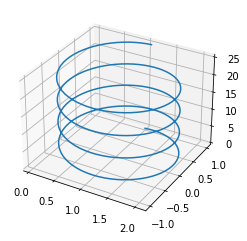

In [13]:
ax = plt.axes(projection='3d')
ax.plot3D(x_log[:,0], x_log[:,1], x_log[:,2])

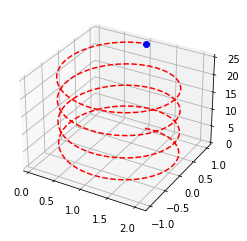

In [14]:
from matplotlib import animation
from JSAnimation import IPython_display    
from IPython.display import HTML
    

fig = plt.figure()
ax = fig.add_subplot(projection='3d')

def animate(t):
    ax.clear()
    
    # Path
    ax.plot3D(x_log[:,0], x_log[:,1], x_log[:,2], 'r--')
    
    # Initial conditions
    ax.plot3D(x_log[t,0], x_log[t,1], x_log[t,2], 'bo')
    
    

anim = animation.FuncAnimation(fig, animate, frames=len(time), interval=60)

HTML(anim.to_jshtml())